# Análise de Dados sobre Popularidade de Músicas no Spotify 🎵📊

**Projeto Final | Módulo: Machine Learning 1 | Programa <BeTech\> by Braskem**

**Alunos:**
- Caio Henrique
- Daniel Costa
- Janderson Freitas
- Maria Carolina Barros
- Robinson

## Introdução

Este é o projeto final do módulo "Machine Learning 1". Nossa missão é prever a popularidade de músicas no Spotify. Imagine que estamos atuando como uma gravadora e desejamos criar um modelo capaz de antecipar quais músicas têm potencial para se tornarem populares.

Para realizar essa tarefa, utilizaremos o conjunto de dados do Spotify, disponível no Kaggle. Este conjunto de dados contém informações sobre diversas características das músicas, como *danceability*, *energy*, *loudness*, entre outras, bem como uma medida de *popularidade*.

Nosso objetivo é explorar esses dados, criar modelos de machine learning e identificar a popularidade das músicas. Com isso, esperamos tomar decisões mais informadas ao escolher músicas para promover e investir.

Vamos começar nossa jornada de análise e predição de popularidade de músicas!🎵🔍

## Contexto

O contexto desse projeto é o de uma gravadora que deseja utilizar dados e modelos de machine learning para identificar quais músicas têm potencial para se tornarem populares. Ao entender as características que influenciam na popularidade das músicas, a gravadora pode tomar decisões mais estratégicas em relação às músicas que promove e investe.

## Dataset

Utilizaremos o conjunto de dados do Spotify, disponível no [*Kaggle*](https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset). Este conjunto contém informações detalhadas sobre as características de várias músicas, bem como sua popularidade.

## Objetivos

Nossos principais objetivos neste projeto são:

> Explorar e analisar o conjunto de dados do Spotify para entender as características das músicas.

> Desenvolver modelos de machine learning capazes de prever a popularidade das músicas.

Vamos mergulhar nos dados e iniciar nossa jornada de análise e predição de popularidade musical! 🎵🔍


In [ ]:
pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 39.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 82.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=149a91c09681f831b79a1114a9f939fef1699f1c7d503e31bf7c39b3c83bf6dd
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
ERROR: Operation cancelled by user


In [ ]:
# Importando bibliotecas
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
#from ydata_profiling import ProfileReport




import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Importando csv
df_raw = pd.read_csv('dataset.csv')
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

## Features Disponíveis

- **track_id:** O identificador exclusivo do Spotify para a faixa.
- **artists:** Nomes dos artistas que executaram a faixa.
- **album_name:** O título do álbum que inclui a faixa.
- **track_name:** O nome da faixa.
- **popularity:** Uma pontuação de popularidade variando de 0 a 100, onde 100 indica a maior popularidade.
- **duration_ms:** A duração da faixa em milissegundos.
- **explicit:** Indica se a faixa contém letras explícitas (true = sim, contém; false = não, não contém, ou desconhecido).
- **danceability:** Uma medida de quão adequada a faixa é para dançar, com valores entre 0,0 e 1,0.
- **energy:** A energia é uma medida perceptual de intensidade e atividade, variando de 0,0 a 1,0.
- **key:** A tonalidade musical da faixa, mapeada para a notação padrão de Classe de Altura (por exemplo, 0 = Dó, 1 = Dó♯/Ré♭, 2 = Ré e assim por diante). Se nenhuma tonalidade for detectada, o valor é -1.
- **loudness:** A intensidade geral da faixa em decibéis (dB).
- **mode:** Indica a modalidade da faixa (maior = 1, menor = 0).
- **speechiness:** Detecta a presença de palavras faladas na faixa, com valores entre 0 e 1.
- **acousticness:** Uma medida de confiança (0,0 a 1,0) indicando se a faixa é acústica (1,0 representa alta confiança na natureza acústica).
- **instrumentalness:** Prevê se uma faixa contém vocais (valores mais próximos de 1,0 sugerem ausência de conteúdo vocal).
- **liveness:** Detecta a presença de uma plateia na gravação, com valores entre 0,0 e 1,0.
- **valence:** Uma medida (0,0 a 1,0) descrevendo a positividade musical transmitida pela faixa.
- **tempo:** O tempo estimado da faixa em batidas por minuto (BPM).
- **time_signature:** Uma notação que especifica o número de batidas em cada compasso ou medida.
- **track_genre:** O gênero ao qual a faixa pertence.




In [ ]:
df_raw.drop(columns = 'Unnamed: 0', axis = 1, inplace = True)

In [ ]:
dataset = df_raw.copy()

In [ ]:
# Verificando nulos

dataset.isna().sum()

track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [ ]:
dataset.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


Tendo em vista que temos apenas 2 nulos dentre 114 mil entradas, podemos dropar esses dados


In [ ]:
dataset.dropna(inplace=True)
dataset.shape

(113999, 20)

Verificando número de ids únicas para músicas. (Identificando e removendo duplicatas)

In [ ]:
dataset['track_id'].nunique()

89740

In [ ]:
duplicated = dataset[dataset['track_id'].duplicated(keep = False)]
print(duplicated.shape)
duplicated.groupby('track_id')['track_id'].count()

(40900, 20)


track_id
001APMDOl3qtx1526T11n1    2
001YQlnDSduXd5LgBd66gT    2
003vvx7Niy0yvhvHt4a68B    3
004h8smbIoAkUNDJvVKwkG    2
006rHBBNLJMpQs8fRC2GDe    3
                         ..
7ztSVy67w9rXpKg5L2zN5l    2
7zubR9uYAWjb5KPZTMm85e    4
7zumacGldlmxpoP8bpaeLe    2
7zv2vmZq8OjS54BxFzI2wM    2
7zwn1eykZtZ5LODrf7c0tS    3
Name: track_id, Length: 16641, dtype: int64

O dataframe tem 114.000 linhas e temos apenas 89.741 track_ids exclusivos, o que significa que há cerca de 24.259 valores duplicados no conjunto de dados. Ao investigar mais, descobrimos que havia 16.642 músicas diferentes ocorrendo várias vezes. Precisamos removê-los e limpar os dados para análise posterior.

In [ ]:
dataset = dataset[dataset['track_id'].duplicated(keep = 'first') == False]
dataset.shape

(89740, 20)

In [ ]:
dataset.drop('track_id', axis = 1, inplace = True )

## EDA

pandas-profiling

In [ ]:
profile = ProfileReport(dataset, title="Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Feature Engineering

Precisamos normalizar os dados. Todas as entradas estão entre 0 e 1, exceto *duration_ms*, *tempo* e *time_signature*. O maior problema é *duration_ms* que está em Milissegundos, variando então entre 8586ms e 5237295ms. Vamos trazer a duração para minutos.

Foi possivel observar Alta dependencia linear entre (Energy + Loudness) e (Energy + Acousticness), Resolvemos retirar a coluna Energy para diminuir a correlação entre as features  

In [ ]:
dataset.drop('energy', axis = 1, inplace = True)

In [ ]:
dataset = dataset[['artists', 'popularity', 'danceability',
                  'loudness', 'speechiness', 'acousticness',
                  'instrumentalness', 'liveness', 'valence',
                  'tempo', 'track_genre', 'duration_ms']]

In [ ]:
dataset = dataset.convert_dtypes()
dataset.dtypes

artists              string
popularity            Int64
danceability        Float64
loudness            Float64
speechiness         Float64
acousticness        Float64
instrumentalness    Float64
liveness            Float64
valence             Float64
tempo               Float64
track_genre          string
duration_ms           Int64
dtype: object

Passando Duração para minutos

In [ ]:
dataset['duration_minutes'] = dataset['duration_ms'] / 60000
dataset.drop('duration_ms', axis = 1, inplace = True)

## Lidando com outliers e filtrando dados não relevantes
Speechiness é uma medida de quão falada uma faixa é. Faixas acima de 0.6 são praticamente podcasts e talk-shows.

In [ ]:
index = dataset[dataset['speechiness'] > 0.6].index
dataset.drop(index, inplace=True)

Algumas músicas tem tempo em 0 BPM, o que não faz sentido pra nossa análise. Drop neles.

In [ ]:
index = dataset[dataset['tempo'] == 0].index
dataset.drop(index, inplace=True)

Desconsideramos faixas zeradas ou com duração superior a 25 minutos.

In [ ]:
index = dataset[(dataset['duration_minutes'] == 0) | (dataset['duration_minutes'] > 20)].index
dataset.drop(index, inplace=True)

## Estatística Descritiva
Variáveis Numéricas

In [ ]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,88603.0,33.294211,20.66048,0.0,19.0,34.0,49.0,100.0
danceability,88603.0,0.563194,0.175828,0.0513,0.45,0.577,0.693,0.985
loudness,88603.0,-8.444241,5.170191,-46.591,-10.2465,-7.147,-5.091,4.532
speechiness,88603.0,0.079352,0.078786,0.0221,0.0359,0.0486,0.0839,0.6
acousticness,88603.0,0.323424,0.336387,0.0,0.0166,0.182,0.613,0.996
instrumentalness,88603.0,0.174181,0.324226,0.0,0.0,0.000064,0.1,1.0
liveness,88603.0,0.211674,0.187623,0.00925,0.0979,0.131,0.272,1.0
valence,88603.0,0.470831,0.262789,0.0,0.25,0.459,0.684,0.995
tempo,88603.0,122.499179,29.613055,30.2,99.927,122.089,140.1495,243.372
duration_minutes,88603.0,3.795225,1.506349,0.263333,2.891783,3.557767,4.4015,19.90095


Variáveis Categóricas

In [ ]:
dataset.describe(include= 'string')

,artists,track_genre
count,88603,88603
unique,31182,113
top,George Jones,acoustic
freq,260,1000


In [ ]:
dataset['artists'].value_counts()

George Jones                                         260
my little airport                                    171
The Beatles                                          149
BTS                                                  143
Håkan Hellström                                      140
                                                    ... 
Leandro Sapucahy;Renatinho Bokaloka;Suel;Lucia...      1
Akatu;Grupo Revelação;Vitinho;Xande De Pilares         1
Zeca Pagodinho;Jorge Ben Jor                           1
Xande De Pilares;Jorginho China                        1
Jesus Culture                                          1
Name: artists, Length: 31182, dtype: Int64

Verificando Artistas com apenas uma música

In [ ]:
sum(dataset['artists'].value_counts() == 1)

20054

In [ ]:
dataset['track_genre'].value_counts()

acoustic     1000
alt-rock      999
tango         999
cantopop      999
forro         998
             ... 
punk          226
comedy        217
house         210
indie         134
reggaeton      73
Name: track_genre, Length: 113, dtype: Int64

## Usando standart scaler para normalização dos dados

In [ ]:
dataset.columns

Index(['artists', 'popularity', 'danceability', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'track_genre', 'duration_minutes'],
      dtype='object')

Escalando features Numéricas

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88603 entries, 0 to 113999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artists           88603 non-null  string 
 1   popularity        88603 non-null  Int64  
 2   danceability      88603 non-null  Float64
 3   loudness          88603 non-null  Float64
 4   speechiness       88603 non-null  Float64
 5   acousticness      88603 non-null  Float64
 6   instrumentalness  88603 non-null  Float64
 7   liveness          88603 non-null  Float64
 8   valence           88603 non-null  Float64
 9   tempo             88603 non-null  Float64
 10  track_genre       88603 non-null  string 
 11  duration_minutes  88603 non-null  Float64
dtypes: Float64(9), Int64(1), string(2)
memory usage: 9.6 MB


In [ ]:
num_cols = dataset.select_dtypes(include = 'float').columns
num_cols

Index(['danceability', 'loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_minutes'],
      dtype='object')

In [ ]:
num_df = dataset[num_cols]
num_df.head()

,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_minutes
0,0.676,-6.746,0.143,0.0322,0.000001,0.358,0.715,87.917,3.844433
1,0.42,-17.235,0.0763,0.924,0.000006,0.101,0.267,77.489,2.4935
2,0.438,-9.734,0.0557,0.21,0.0,0.117,0.12,76.332,3.513767
3,0.266,-18.515,0.0363,0.905,0.000071,0.132,0.143,181.74,3.36555
4,0.618,-9.681,0.0526,0.469,0.0,0.0829,0.167,119.949,3.314217


In [ ]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
ss.fit(num_df)

scaled = ss.fit_transform(num_df)
scaled_dataset = pd.DataFrame(scaled, columns = num_df.columns)

In [ ]:
dataset = dataset.drop(columns=num_df.columns, axis = 1)
dataset.reset_index(drop=True, inplace=True)
scaled_dataset.reset_index(drop=True, inplace=True)

dataset.shape, scaled_dataset.shape

((88603, 3), (88603, 9))

In [ ]:
dataset = pd.concat([dataset, scaled_dataset], axis = 1)
dataset.shape

(88603, 12)

In [ ]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,88603.0,33.294211,20.66048,0.0,19.0,34.0,49.0,100.0
danceability,88603.0,-0.0,1.000006,-2.911342,-0.643777,0.078522,0.73826,2.398981
loudness,88603.0,-0.0,1.000006,-7.378253,-0.348589,0.250909,0.648576,2.509833
speechiness,88603.0,-0.0,1.000006,-0.726675,-0.551516,-0.39032,0.05773,6.6084
acousticness,88603.0,0.0,1.000006,-0.961469,-0.912121,-0.420422,0.860848,1.999425
instrumentalness,88603.0,0.0,1.000006,-0.537224,-0.537224,-0.537027,-0.228795,2.547065
liveness,88603.0,-0.0,1.000006,-1.07889,-0.606398,-0.42998,0.32153,4.201667
valence,88603.0,-0.0,1.000006,-1.791676,-0.840338,-0.045019,0.811185,1.994649
tempo,88603.0,0.0,1.000006,-3.116858,-0.762242,-0.013851,0.596035,4.081764
duration_minutes,88603.0,0.0,1.000006,-2.344683,-0.599759,-0.157639,0.402482,10.691956


Encodando Features Categóricas

In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [ ]:
col = dataset['artists']
encoder.fit(col)
encoded_col = encoder.transform(col)
dataset['artist'] = encoded_col

In [ ]:
col = dataset['track_genre']

encoder.fit(col)

encoded_col = encoder.transform(col)

dataset['genre'] = encoded_col

In [ ]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,88603.0,33.294211,20.66048,0.0,19.0,34.0,49.0,100.0
danceability,88603.0,-0.0,1.000006,-2.911342,-0.643777,0.078522,0.73826,2.398981
loudness,88603.0,-0.0,1.000006,-7.378253,-0.348589,0.250909,0.648576,2.509833
speechiness,88603.0,-0.0,1.000006,-0.726675,-0.551516,-0.39032,0.05773,6.6084
acousticness,88603.0,0.0,1.000006,-0.961469,-0.912121,-0.420422,0.860848,1.999425
instrumentalness,88603.0,0.0,1.000006,-0.537224,-0.537224,-0.537027,-0.228795,2.547065
liveness,88603.0,-0.0,1.000006,-1.07889,-0.606398,-0.42998,0.32153,4.201667
valence,88603.0,-0.0,1.000006,-1.791676,-0.840338,-0.045019,0.811185,1.994649
tempo,88603.0,0.0,1.000006,-3.116858,-0.762242,-0.013851,0.596035,4.081764
duration_minutes,88603.0,0.0,1.000006,-2.344683,-0.599759,-0.157639,0.402482,10.691956


## Regressão Linear

In [ ]:
from sklearn.model_selection import train_test_split, KFold

from sklearn.linear_model import LinearRegression as linreg
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.tree import DecisionTreeRegressor

from sklearn.metrics import mean_squared_error as MSE

In [ ]:
X = dataset.drop(columns = ['popularity', 'artists', 'track_genre'], axis = 1)
y = dataset['popularity']

In [ ]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, random_state=1234)

In [ ]:
lin_reg = linreg()

lin_reg.fit(Xtrain, ytrain)

y_pred_train = lin_reg.predict(Xtrain)
y_pred = lin_reg.predict(Xtest)

Vamos agora calcular a perda entre os valores alvo reais no conjunto de teste e os valores previstos pelo modelo com o uso de uma função de custo chamada Root Mean Square Error (RMSE).

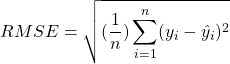

In [ ]:
mse_y_train = MSE(y_pred_train, ytrain)
mse_y_test = MSE(y_pred, ytest)

print('Referencia train RMSE:', np.sqrt(mse_y_train))
print('Referencia test RMSE:', np.sqrt(mse_y_test))

Referencia train RMSE: 20.33852643281916
Referencia test RMSE: 20.37790519446195


O RMSE de um modelo determina o ajuste absoluto do modelo aos dados. Em outras palavras, indica o quão próximos os pontos de dados reais estão dos valores previstos do modelo. Um valor baixo de RMSE indica um melhor ajuste e é uma boa medida para determinar a precisão das previsões do modelo.

## Checando Linearidade dos dados para validação do modelo de Regressão

In [ ]:
residual_matrix = pd.DataFrame({'Pred': y_pred_train, 'Actual': ytrain})
residual_matrix['Residuals'] = residual_matrix['Pred'] - residual_matrix['Actual']
residual_matrix

,Pred,Actual,Residuals
72959,32.151801,9,23.151801
69613,36.016792,40,-3.983208
42487,35.920855,55,-19.079145
74311,28.692888,55,-26.307112
78702,34.349515,32,2.349515
...,...,...,...
32399,39.079308,33,6.079308
82584,34.704169,37,-2.295831
60620,31.614365,41,-9.385635
34086,37.759058,25,12.759058


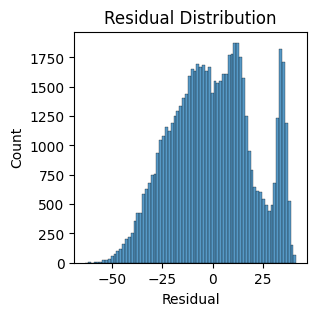

In [ ]:
plt.figure(figsize = (3,3), dpi = 100)
sns.histplot(residual_matrix['Residuals'], fill = True)
plt.xlabel('Residual')
plt.title('Residual Distribution')
plt.show()

A distribuição de Resíduos NÃO É NORMAL. Evitaremos a regressão linear.

https://medium.com/@lauradamaceno/entendendo-regress%C3%A3o-linear-as-suposi%C3%A7%C3%B5es-por-tr%C3%A1s-de-tudo-d0e29004c7f8

## Fold Cross Validation Modeling

In [ ]:
def cv_score(ml_model, cols):
    i = 1
    rmse_score = []
    X1 = X[cols]

    kf = KFold(n_splits = 5, random_state = 42, shuffle = True)

    for train_index, test_index in kf.split(X1):
        xtr, xval = X1.loc[train_index], X1.loc[test_index]
        ytr, yval = y.loc[train_index], y.loc[test_index]

        model = ml_model
        model.fit(xtr, ytr)
        pred_value = model.predict(xval)

        mse = MSE(pred_value, yval)
        rmse = np.sqrt(mse)
        print('\n for {} of KFold{}, RMSE Score is:  {}'.format(i, kf.n_splits, rmse))

        rmse_score.append(rmse)
        i+=1

    return rmse_score, pred_value, yval

## Decision Tree: Sem validação

In [ ]:
tree_model = DecisionTreeRegressor(min_samples_leaf = 25, min_samples_split = 25)

In [ ]:
xtr, xtest, ytr, ytest = train_test_split(X,y, test_size = 0.33, random_state = 423)

In [ ]:
tree_model.fit(xtr, ytr)

train_preds = tree_model.predict(xtr)
test_preds = tree_model.predict(xtest)

train_mse = MSE(train_preds, ytr)
test_mse = MSE(test_preds, ytest)

np.sqrt(train_mse), np.sqrt(test_mse)

(14.540769070806904, 17.042215058554408)

## Cross Validated Decision Tree

In [ ]:
cv_dt, y_pred_value5, yval5 = cv_score(tree_model, cols = X.columns)
cv_dt


 for 1 of KFold5, RMSE Score is:  16.743284662778358

 for 2 of KFold5, RMSE Score is:  16.777882143826375

 for 3 of KFold5, RMSE Score is:  17.489266528421815

 for 4 of KFold5, RMSE Score is:  16.885467035562034

 for 5 of KFold5, RMSE Score is:  16.79980446445355


[16.743284662778358,
 16.777882143826375,
 17.489266528421815,
 16.885467035562034,
 16.79980446445355]

In [ ]:
from sklearn.feature_selection import RFE

model = tree_model
rfe = RFE(estimator = model, n_features_to_select = 1, step = 1)
rfe.fit(X,y)

RFE(estimator=DecisionTreeRegressor(min_samples_leaf=25, min_samples_split=25),
    n_features_to_select=1)

In [ ]:
ranking_df = pd.DataFrame()
ranking_df['Feature'] = X.columns
ranking_df['Rank'] = rfe.ranking_

In [ ]:
ranked = ranking_df.sort_values(by = 'Rank')
ranked

,Feature,Rank
10,genre,1
9,artist,2
3,acousticness,3
1,loudness,4
8,duration_minutes,5
0,danceability,6
4,instrumentalness,7
6,valence,8
7,tempo,9
2,speechiness,10


In [ ]:
ranked['Feature'][:10].values

array(['genre', 'artist', 'acousticness', 'loudness', 'duration_minutes',
       'danceability', 'instrumentalness', 'valence', 'tempo',
       'speechiness'], dtype=object)

In [ ]:
cv_dt_top10, pred_value_top10, yval_top10 = cv_score(tree_model, cols = ranked['Feature'][:10].values)
cv_dt_top10


 for 1 of KFold5, RMSE Score is:  16.691246074629092

 for 2 of KFold5, RMSE Score is:  16.75909001094671

 for 3 of KFold5, RMSE Score is:  17.32713990050095

 for 4 of KFold5, RMSE Score is:  16.89741867760642

 for 5 of KFold5, RMSE Score is:  16.784201637589938


[16.691246074629092,
 16.75909001094671,
 17.32713990050095,
 16.89741867760642,
 16.784201637589938]

Comparação

In [ ]:
score_matrix = pd.DataFrame({'decision': cv_dt, 'decision10': cv_dt_top10})
score_matrix

,decision,decision10
0,16.743285,16.691246
1,16.777882,16.759090
2,17.489267,17.327140
3,16.885467,16.897419
4,16.799804,16.784202


In [ ]:
pred_value_top10.shape

(17720,)

In [ ]:
yval_top10.shape

(17720,)

# CV_DecisionTreeReg x CV_DecisionTreeReg-REF

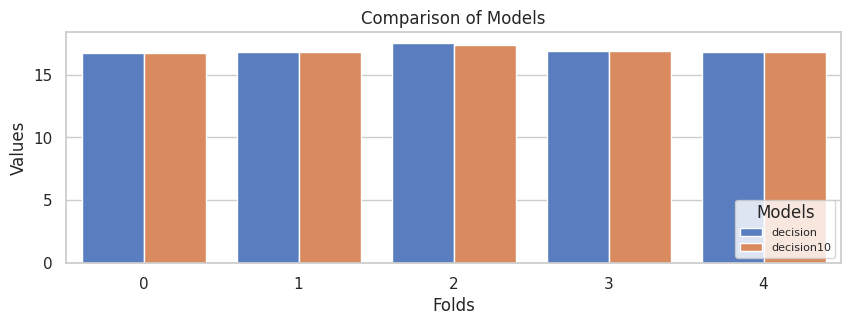

In [ ]:
score_matrix_melted = score_matrix.reset_index().melt(id_vars='index',
                                                      var_name='Model',
                                                      value_name='Value')

# Set the style for the plot
sns.set(style='whitegrid')

# Create the bar plot
plt.figure(figsize=(10, 3), dpi = 100)
sns.barplot(data=score_matrix_melted, x='index', y='Value',
            hue='Model', palette='muted')

plt.xlabel('Folds')
plt.ylabel('Values')
plt.title('Comparison of Models')
plt.legend(title='Models', loc='lower right', fontsize = 8)
plt.show()

# Plotando resultados

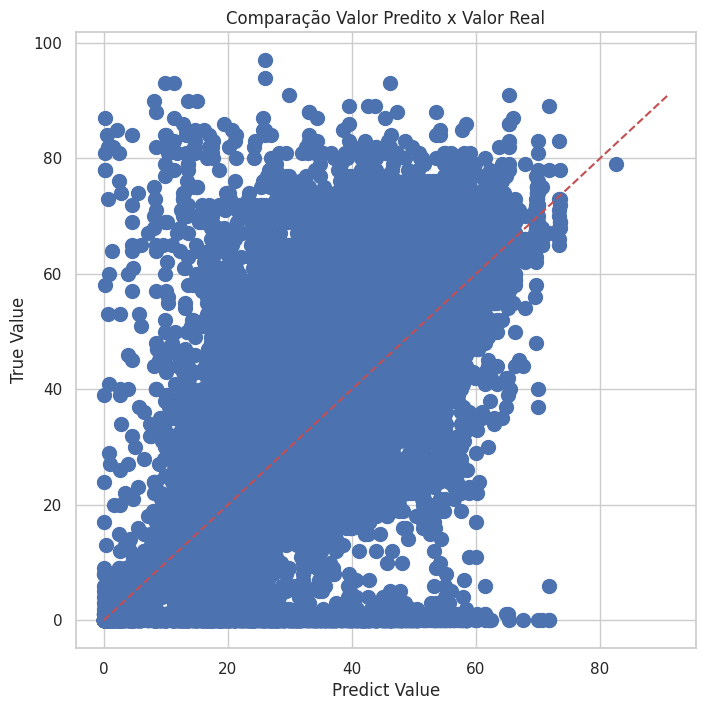

In [ ]:

fig = plt.figure(figsize =(8,8))

l = plt.plot(pred_value_top10, yval_top10, 'bo')

plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')

plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

xl = np.arange(min(pred_value_top10), 1.2*max(pred_value_top10),
               (max(pred_value_top10)-min(pred_value_top10))/10)
yl = xl
plt.plot(xl,yl,'r--')

plt.show()